In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

1) Prepare a classification model using Naive Bayes 
for salary data 

Data Description:

age -- age of a person
workclass	-- A work class is a grouping of work 
education	-- Education of an individuals	
maritalstatus -- Marital status of an individulas	
occupation	 -- occupation of an individuals
relationship -- 	
race --  Race of an Individual
sex --  Gender of an Individual
capitalgain --  profit received from the sale of an investment	
capitalloss	-- A decrease in the value of a capital asset
hoursperweek -- number of hours work per week	
native -- Native of an individual
Salary -- salary of an individual

1.Read the data

In [2]:
traind=pd.read_csv('SalaryData_Train.csv')
traind.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,State-gov,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


2.Perform EDA

In [3]:
traind.shape

(30161, 14)

In [4]:
traind.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [5]:
traind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30161 entries, 0 to 30160
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            30161 non-null  int64 
 1   workclass      30161 non-null  object
 2   education      30161 non-null  object
 3   educationno    30161 non-null  int64 
 4   maritalstatus  30161 non-null  object
 5   occupation     30161 non-null  object
 6   relationship   30161 non-null  object
 7   race           30161 non-null  object
 8   sex            30161 non-null  object
 9   capitalgain    30161 non-null  int64 
 10  capitalloss    30161 non-null  int64 
 11  hoursperweek   30161 non-null  int64 
 12  native         30161 non-null  object
 13  Salary         30161 non-null  object
dtypes: int64(5), object(9)
memory usage: 3.2+ MB


In [6]:
traind['Salary'].unique()

array([' <=50K', ' >50K'], dtype=object)

In [7]:
traind['Salary'].value_counts()

 <=50K    22653
 >50K      7508
Name: Salary, dtype: int64

In [8]:
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
le=LabelEncoder()
mms=MinMaxScaler()

In [9]:
traind['workclass']=le.fit_transform(traind['workclass'])
traind['education']=le.fit_transform(traind['education'])
traind['maritalstatus']=le.fit_transform(traind['maritalstatus'])
traind['occupation']=le.fit_transform(traind['occupation'])
traind['relationship']=le.fit_transform(traind['relationship'])
traind['race']=le.fit_transform(traind['race'])
traind['sex']=le.fit_transform(traind['sex'])
traind['native']=le.fit_transform(traind['native'])
traind['Salary']=le.fit_transform(traind['Salary'])

In [10]:
traind['capitalgain']=mms.fit_transform(traind['capitalgain'].values.reshape(-1,1))
traind['capitalloss']=mms.fit_transform(traind['capitalloss'].values.reshape(-1,1))
traind['hoursperweek']=mms.fit_transform(traind['hoursperweek'].values.reshape(-1,1))

In [11]:
traind

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,39,5,9,13,4,0,1,4,1,0.021740,0.0,0.397959,37,0
1,50,4,9,13,2,3,0,4,1,0.000000,0.0,0.122449,37,0
2,38,2,11,9,0,5,1,4,1,0.000000,0.0,0.397959,37,0
3,53,2,1,7,2,5,0,2,1,0.000000,0.0,0.397959,37,0
4,28,2,9,13,2,9,5,2,0,0.000000,0.0,0.397959,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30156,27,2,7,12,2,12,5,4,0,0.000000,0.0,0.377551,37,0
30157,40,2,11,9,2,6,0,4,1,0.000000,0.0,0.397959,37,1
30158,58,2,11,9,6,0,4,4,0,0.000000,0.0,0.397959,37,0
30159,22,2,11,9,4,0,3,4,1,0.000000,0.0,0.193878,37,0


In [12]:
traind.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
30156    False
30157     True
30158    False
30159     True
30160    False
Length: 30161, dtype: bool

In [13]:
traind[traind.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
326,33,2,9,13,2,3,0,4,1,0.0,0.0,0.397959,37,1
364,27,2,9,13,4,2,1,4,1,0.0,0.0,0.500000,37,0
518,24,2,11,9,4,5,4,2,0,0.0,0.0,0.397959,37,0
525,24,2,11,9,4,2,3,4,1,0.0,0.0,0.397959,37,0
619,33,2,9,13,2,3,0,4,1,0.0,0.0,0.397959,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30110,47,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
30118,20,2,11,9,4,6,3,4,1,0.0,0.0,0.397959,37,0
30132,22,2,15,10,4,0,3,4,1,0.0,0.0,0.397959,37,0
30157,40,2,11,9,2,6,0,4,1,0.0,0.0,0.397959,37,1


In [14]:
traind.drop_duplicates(inplace=True)

3.Perform Visualizations

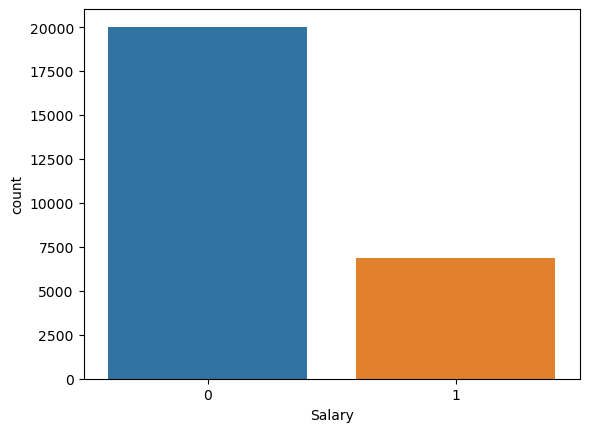

0    20023
1    20023
Name: Salary, dtype: int64

In [79]:
sns.countplot(x='Salary',data= traind)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
train['Salary'].value_counts()

<Axes: xlabel='education'>

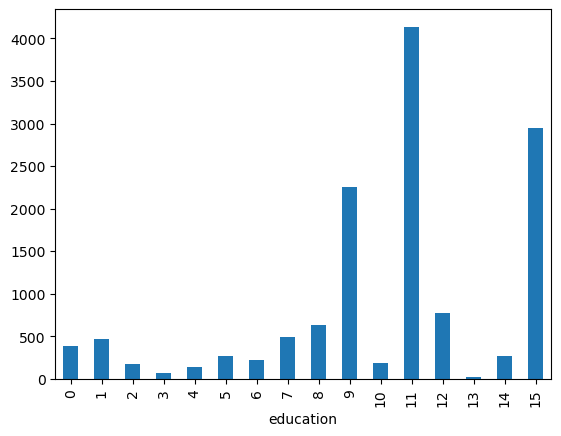

In [80]:
pd.crosstab(traind['Salary'],traind['education']).mean().plot(kind='bar')

<Axes: xlabel='occupation'>

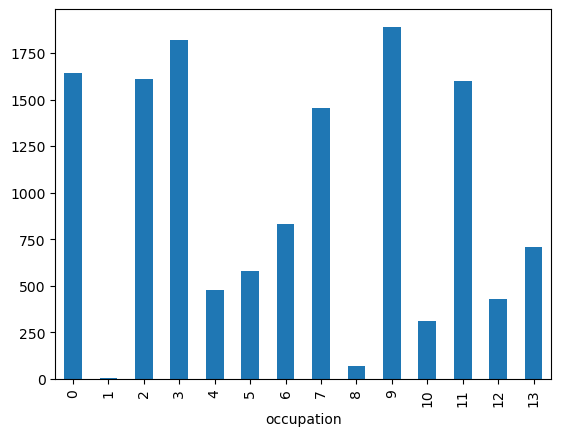

In [81]:
pd.crosstab(traind['Salary'],traind['occupation']).mean().plot(kind='bar')

<Axes: xlabel='sex'>

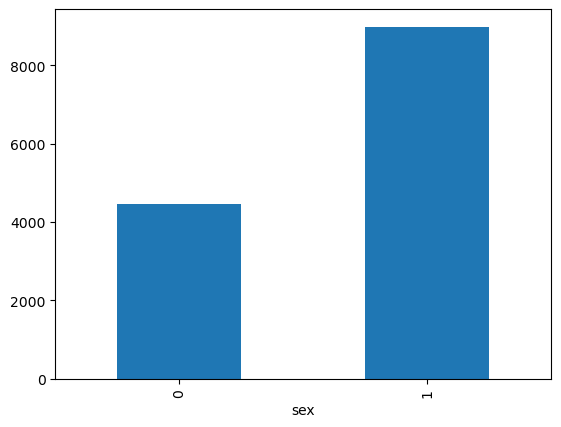

In [82]:
pd.crosstab(traind['Salary'],traind['sex']).mean().plot(kind='bar')

<Axes: xlabel='relationship'>

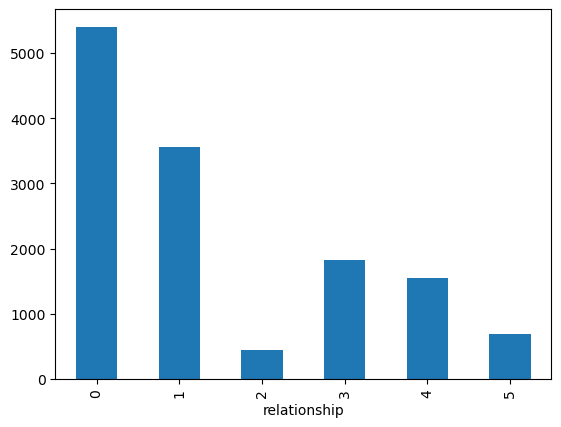

In [83]:
pd.crosstab(traind['Salary'],traind['relationship']).mean().plot(kind='bar')

In [15]:
traind.shape

(26903, 14)

4.Perform EDA2

In [16]:
traind.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30154,False,False,False,False,False,False,False,False,False,False,False,False,False,False
30155,False,False,False,False,False,False,False,False,False,False,False,False,False,False
30156,False,False,False,False,False,False,False,False,False,False,False,False,False,False
30158,False,False,False,False,False,False,False,False,False,False,False,False,False,False


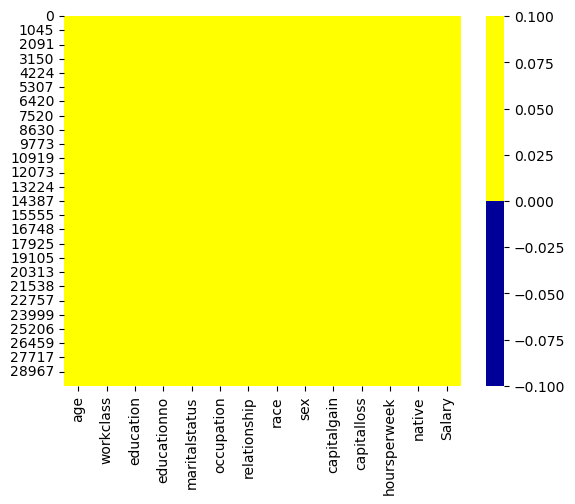

In [17]:
colours = ['#000099', '#ffff00'] 
pal = sns.color_palette(colours)
sns.heatmap(traind.isnull(), cmap=pal)
plt.show()

5.Check CO-relation

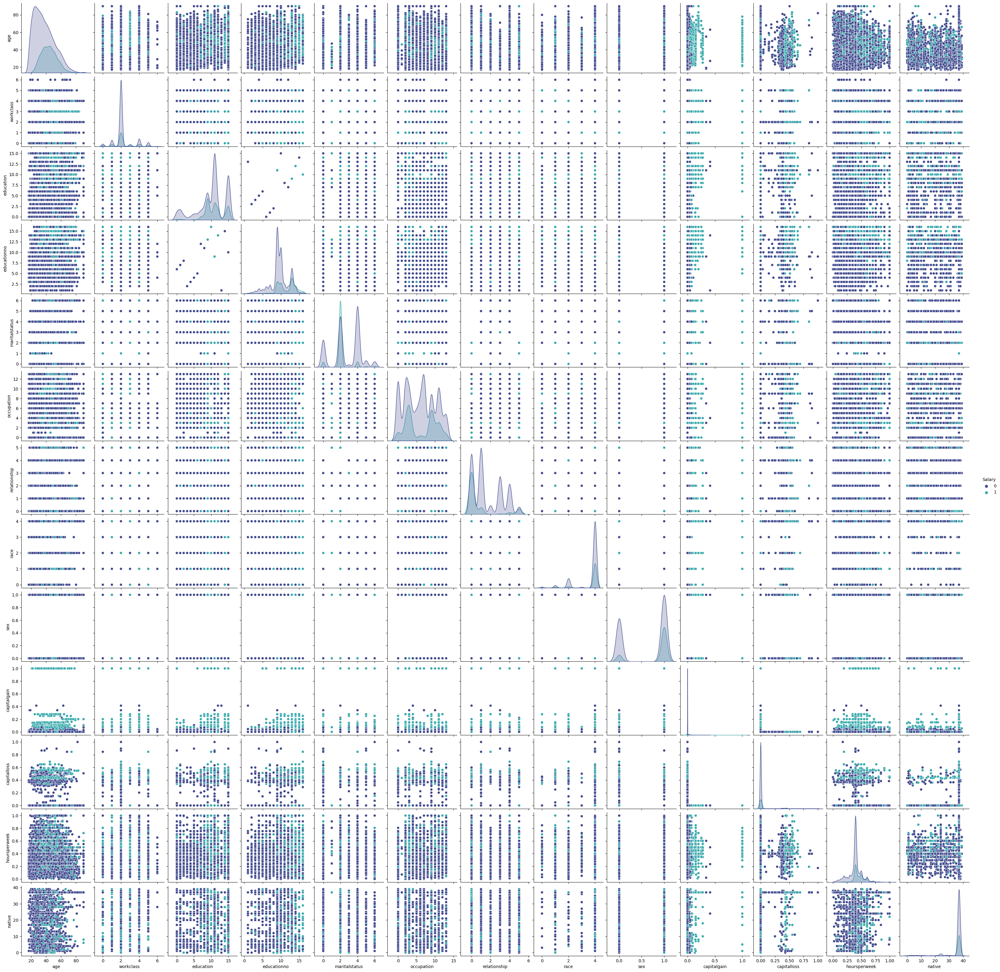

In [18]:
sns.pairplot(traind,palette='mako', hue='Salary')
plt.show()

In [19]:
traind.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.075184,0.002717,0.038048,-0.245062,-0.004570,-0.231111,0.040457,0.070434,0.077235,0.052684,0.072529,0.010626,0.223502
workclass,0.075184,1.000000,0.021289,0.037806,-0.031961,0.014047,-0.070996,0.051479,0.079380,0.033217,0.002739,0.047169,0.012683,0.016577
education,0.002717,0.021289,1.000000,0.359940,-0.040931,-0.025890,-0.010801,0.005572,-0.029841,0.034550,0.020469,0.058709,0.076605,0.090094
educationno,0.038048,0.037806,0.359940,1.000000,-0.066536,0.084300,-0.092236,0.035215,0.010941,0.126085,0.080025,0.145491,0.096279,0.332178
maritalstatus,-0.245062,-0.031961,-0.040931,-0.066536,1.000000,0.015094,0.155553,-0.073628,-0.108928,-0.042087,-0.033890,-0.175692,-0.029585,-0.184559
occupation,-0.004570,0.014047,-0.025890,0.084300,0.015094,1.000000,-0.063950,0.008183,0.066919,0.019724,0.010873,0.023073,0.003024,0.050711
relationship,-0.231111,-0.070996,-0.010801,-0.092236,0.155553,-0.063950,1.000000,-0.113708,-0.586804,-0.063322,-0.070351,-0.248745,-0.006126,-0.247438
race,0.040457,0.051479,0.005572,0.035215,-0.073628,0.008183,-0.113708,1.000000,0.085786,0.020049,0.032111,0.056460,0.118907,0.079109
sex,0.070434,0.079380,-0.029841,0.010941,-0.108928,0.066919,-0.586804,0.085786,1.000000,0.053490,0.053084,0.228767,-0.004930,0.217360
capitalgain,0.077235,0.033217,0.034550,0.126085,-0.042087,0.019724,-0.063322,0.020049,0.053490,1.000000,-0.036023,0.079403,0.012902,0.228865


[]

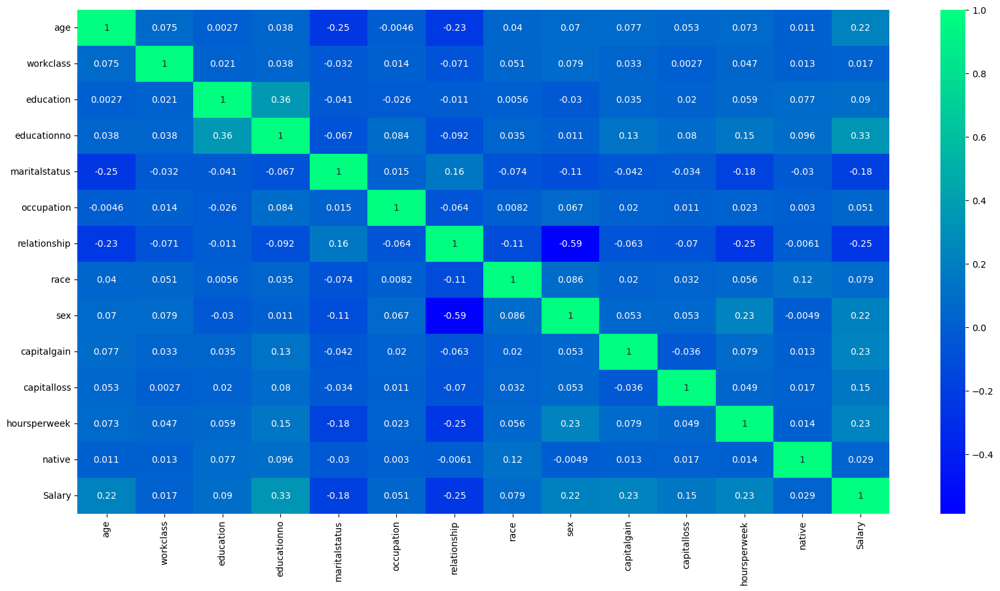

In [20]:
plt.figure(figsize=(20,10))
sns.heatmap(traind.corr(), cmap='winter', annot=True)
plt.plot()

In [21]:
traind.describe()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
count,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000,26903.000000
mean,39.049140,2.217597,10.254135,10.144296,2.563394,6.053674,1.449578,3.645950,0.667621,0.012155,0.022596,0.409843,35.228711,0.255734
std,13.188825,0.996802,3.864670,2.620154,1.528599,4.026816,1.618758,0.871165,0.471075,0.078054,0.097680,0.125990,6.272069,0.436281
min,17.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,2.000000,9.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.397959,37.000000,0.000000
50%,38.000000,2.000000,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,1.000000,0.000000,0.000000,0.397959,37.000000,0.000000
75%,48.000000,2.000000,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.448980,37.000000,1.000000
max,90.000000,6.000000,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,39.000000,1.000000


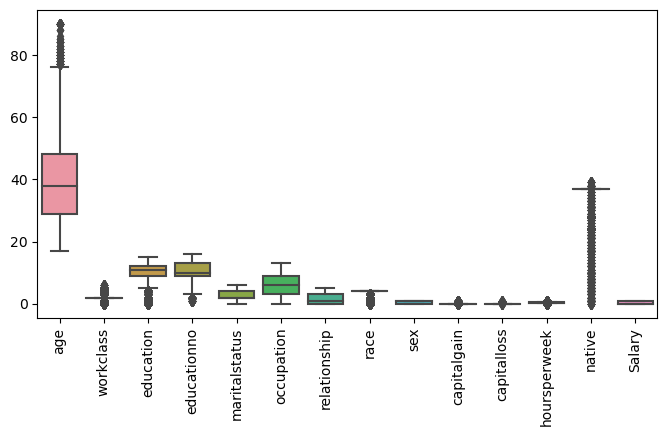

In [22]:
plt.figure(figsize=(8,4))
box = sns.boxplot(data = traind)
plt.xticks(rotation=90)
plt.show()

6.Segregate X and y

In [23]:
tr_X=traind.iloc[:,:13]
tr_y=traind.iloc[:,13]

In [24]:
from imblearn.over_sampling import SMOTE
smote=SMOTE(sampling_strategy='auto')

In [25]:
tr_X,tr_y=smote.fit_resample(tr_X,tr_y)

In [26]:
tr_X['Salary']=tr_y
train=tr_X

In [27]:
train.shape

(40046, 14)

In [28]:
train['Salary'].value_counts()

0    20023
1    20023
Name: Salary, dtype: int64

In [29]:
X_train=train.iloc[:,:13]
y_train=train.iloc[:,13]

# 7.Perform Pipeline , Dimensionality reduction and Naive Bayes

In [30]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
ppl=Pipeline([('pca',PCA()),('nb',GaussianNB())])
ppl.fit(X_train,y_train)

Pipeline(steps=[('pca', PCA()), ('nb', GaussianNB())])

In [31]:
#Predict a train data
predictions=ppl.predict(X_train)
predictions

array([0, 0, 0, ..., 0, 1, 0])

8.Confusion Matrix , Classification Report and Score ROC

In [32]:
from sklearn.metrics import confusion_matrix,classification_report,roc_curve,roc_auc_score

In [33]:
confusion_matrix(y_train,predictions)

array([[16917,  3106],
       [ 6111, 13912]], dtype=int64)

In [34]:
print(classification_report(y_train,predictions))

              precision    recall  f1-score   support

           0       0.73      0.84      0.79     20023
           1       0.82      0.69      0.75     20023

    accuracy                           0.77     40046
   macro avg       0.78      0.77      0.77     40046
weighted avg       0.78      0.77      0.77     40046



In [35]:
#the output probability
train_proba=ppl.predict_proba(X_train)
train_proba

array([[0.79049746, 0.20950254],
       [0.80749297, 0.19250703],
       [0.91211253, 0.08788747],
       ...,
       [0.99602587, 0.00397413],
       [0.34039097, 0.65960903],
       [0.59567389, 0.40432611]])

In [36]:
train_proba[:,1]

array([0.20950254, 0.19250703, 0.08788747, ..., 0.00397413, 0.65960903,
       0.40432611])

In [37]:
#false positive rate,true positive rate,threshhold
fpr,tpr,thresh=roc_curve(y_train,train_proba[:,1])

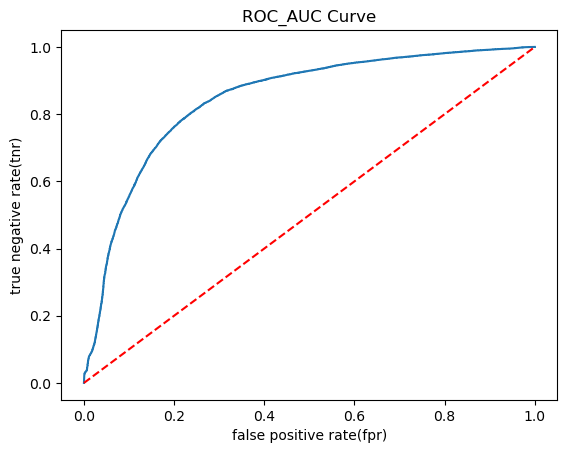

In [38]:
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC_AUC Curve')
plt.xlabel('false positive rate(fpr)')
plt.ylabel('true negative rate(tnr)')
plt.show()

In [39]:
roc_auc_score(y_train,predictions)

0.7698396843629826

In [40]:
from sklearn.manifold import TSNE

In [41]:
model=TSNE(n_components=2)

In [42]:
tsne_comp=model.fit_transform(X_train)
tsne_comp

array([[ -17.073513 ,    7.101778 ],
       [  42.512848 ,   10.045682 ],
       [ -35.355656 ,   33.940952 ],
       ...,
       [  55.356506 ,   84.03655  ],
       [ -67.774734 ,   -1.3404173],
       [ -64.575005 , -101.43375  ]], dtype=float32)

9.Visualization

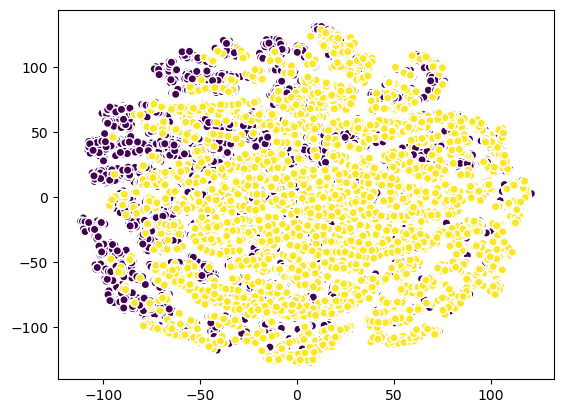

In [43]:
plt.scatter(tsne_comp[:,0],tsne_comp[:,1],c=y_train,cmap='viridis',edgecolors='white')
plt.show()

Same Procedure for Test Data

In [44]:
testd=pd.read_csv('SalaryData_Test.csv')

In [45]:
testd.shape

(15060, 14)

In [46]:
testd.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

In [47]:
testd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            15060 non-null  int64 
 1   workclass      15060 non-null  object
 2   education      15060 non-null  object
 3   educationno    15060 non-null  int64 
 4   maritalstatus  15060 non-null  object
 5   occupation     15060 non-null  object
 6   relationship   15060 non-null  object
 7   race           15060 non-null  object
 8   sex            15060 non-null  object
 9   capitalgain    15060 non-null  int64 
 10  capitalloss    15060 non-null  int64 
 11  hoursperweek   15060 non-null  int64 
 12  native         15060 non-null  object
 13  Salary         15060 non-null  object
dtypes: int64(5), object(9)
memory usage: 1.6+ MB


In [48]:
testd['Salary'].unique()

array([' <=50K', ' >50K'], dtype=object)

In [49]:
testd['Salary'].value_counts()

 <=50K    11360
 >50K      3700
Name: Salary, dtype: int64

In [50]:
testd['workclass']=le.fit_transform(testd['workclass'])
testd['education']=le.fit_transform(testd['education'])
testd['maritalstatus']=le.fit_transform(testd['maritalstatus'])
testd['occupation']=le.fit_transform(testd['occupation'])
testd['relationship']=le.fit_transform(testd['relationship'])
testd['race']=le.fit_transform(testd['race'])
testd['sex']=le.fit_transform(testd['sex'])
testd['native']=le.fit_transform(testd['native'])
testd['Salary']=le.fit_transform(testd['Salary'])

In [51]:
testd['capitalgain']=mms.fit_transform(testd['capitalgain'].values.reshape(-1,1))
testd['capitalloss']=mms.fit_transform(testd['capitalloss'].values.reshape(-1,1))
testd['hoursperweek']=mms.fit_transform(testd['hoursperweek'].values.reshape(-1,1))

In [52]:
testd

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0.000000,0.0,0.397959,37,0
1,38,2,11,9,2,4,0,4,1,0.000000,0.0,0.500000,37,0
2,28,1,7,12,2,10,0,4,1,0.000000,0.0,0.397959,37,1
3,44,2,15,10,2,6,0,2,1,0.076881,0.0,0.397959,37,1
4,34,2,0,6,4,7,1,4,1,0.000000,0.0,0.295918,37,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,33,2,9,13,4,9,3,4,1,0.000000,0.0,0.397959,37,0
15056,39,2,9,13,0,9,1,4,0,0.000000,0.0,0.357143,37,0
15057,38,2,9,13,2,9,0,4,1,0.000000,0.0,0.500000,37,0
15058,44,2,9,13,0,0,3,1,1,0.054551,0.0,0.397959,37,0


In [53]:
testd.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
15055    False
15056    False
15057    False
15058    False
15059    False
Length: 15060, dtype: bool

In [54]:
testd[testd.duplicated()]

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
551,59,2,11,9,0,7,1,4,0,0.0,0.0,0.397959,37,0
601,32,2,11,9,2,11,0,4,1,0.0,0.0,0.397959,37,0
681,40,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
799,24,2,9,13,4,9,1,4,1,0.0,0.0,0.346939,37,0
1044,44,2,14,15,2,9,0,4,1,1.0,0.0,0.602041,37,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15043,51,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0
15044,22,2,15,10,4,2,3,4,1,0.0,0.0,0.397959,37,0
15049,32,2,11,9,2,5,0,4,1,0.0,0.0,0.397959,37,0
15052,31,2,11,9,2,2,0,4,1,0.0,0.0,0.397959,37,0


In [55]:
testd.drop_duplicates(inplace=True)

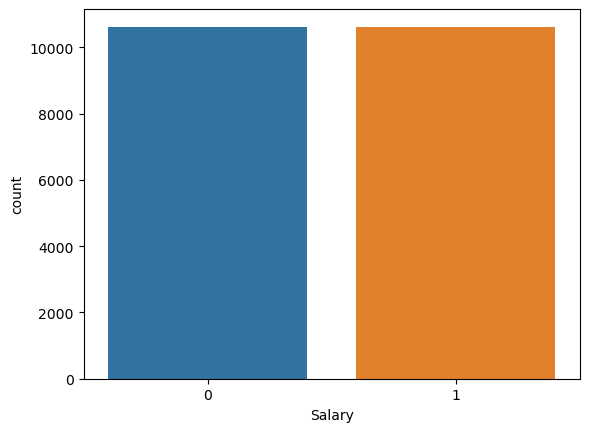

0    10620
1    10620
Name: Salary, dtype: int64

In [84]:
sns.countplot(x='Salary',data= test)
plt.xlabel('Salary')
plt.ylabel('count')
plt.show()
test['Salary'].value_counts()

<Axes: xlabel='education'>

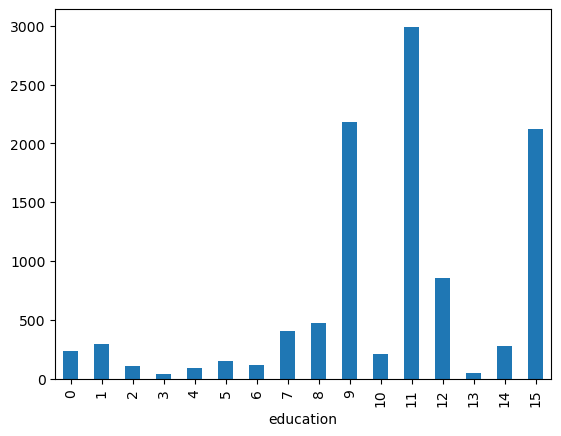

In [85]:
pd.crosstab(test['Salary'],test['education']).mean().plot(kind='bar')

<Axes: xlabel='occupation'>

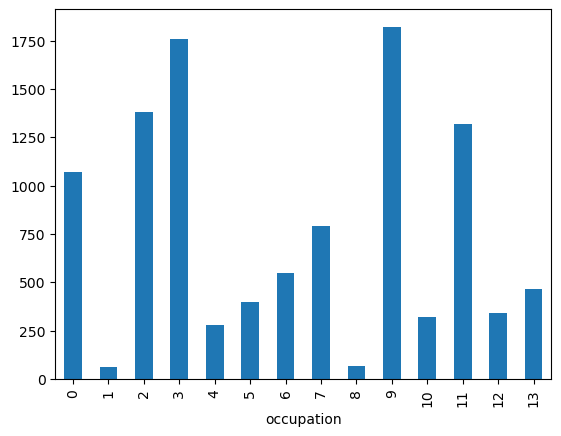

In [86]:
pd.crosstab(test['Salary'],test['occupation']).mean().plot(kind='bar')

<Axes: xlabel='workclass'>

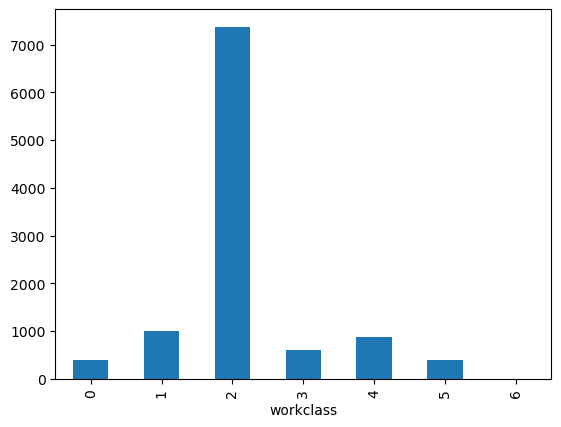

In [87]:
pd.crosstab(test['Salary'],test['workclass']).mean().plot(kind='bar')

<Axes: xlabel='sex'>

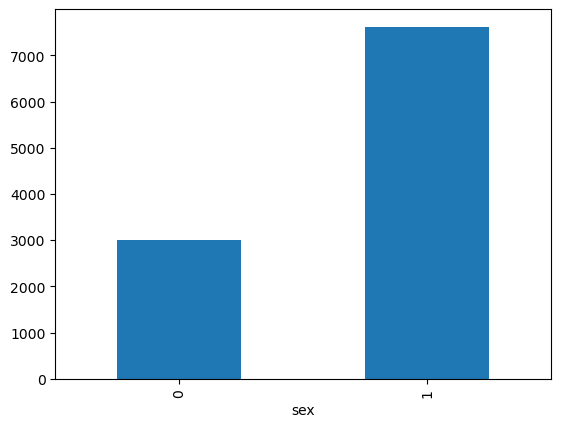

In [88]:
pd.crosstab(test['Salary'],test['sex']).mean().plot(kind='bar')

<Axes: xlabel='relationship'>

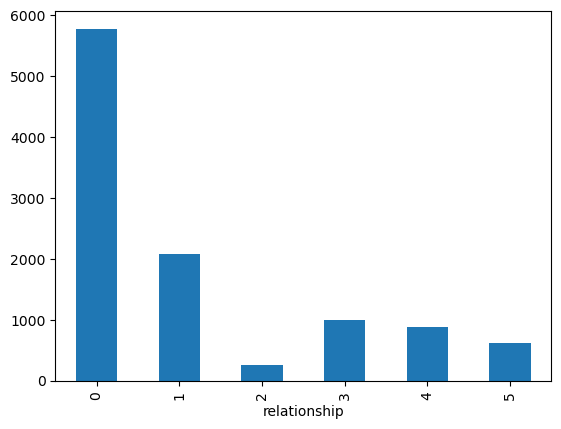

In [89]:
pd.crosstab(test['Salary'],test['relationship']).mean().plot(kind='bar')

In [56]:
testd.shape

(14130, 14)

In [57]:
testd.isnull()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15055,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15056,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15057,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15058,False,False,False,False,False,False,False,False,False,False,False,False,False,False


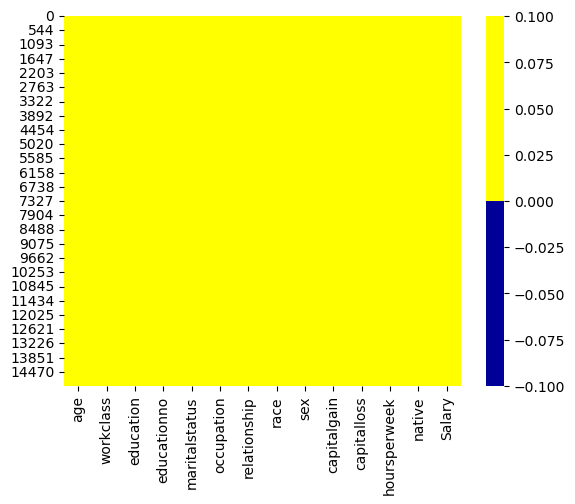

In [58]:
colours = ['#000099', '#ffff00'] 
pal = sns.color_palette(colours)
sns.heatmap(testd.isnull(), cmap=pal)
plt.show()

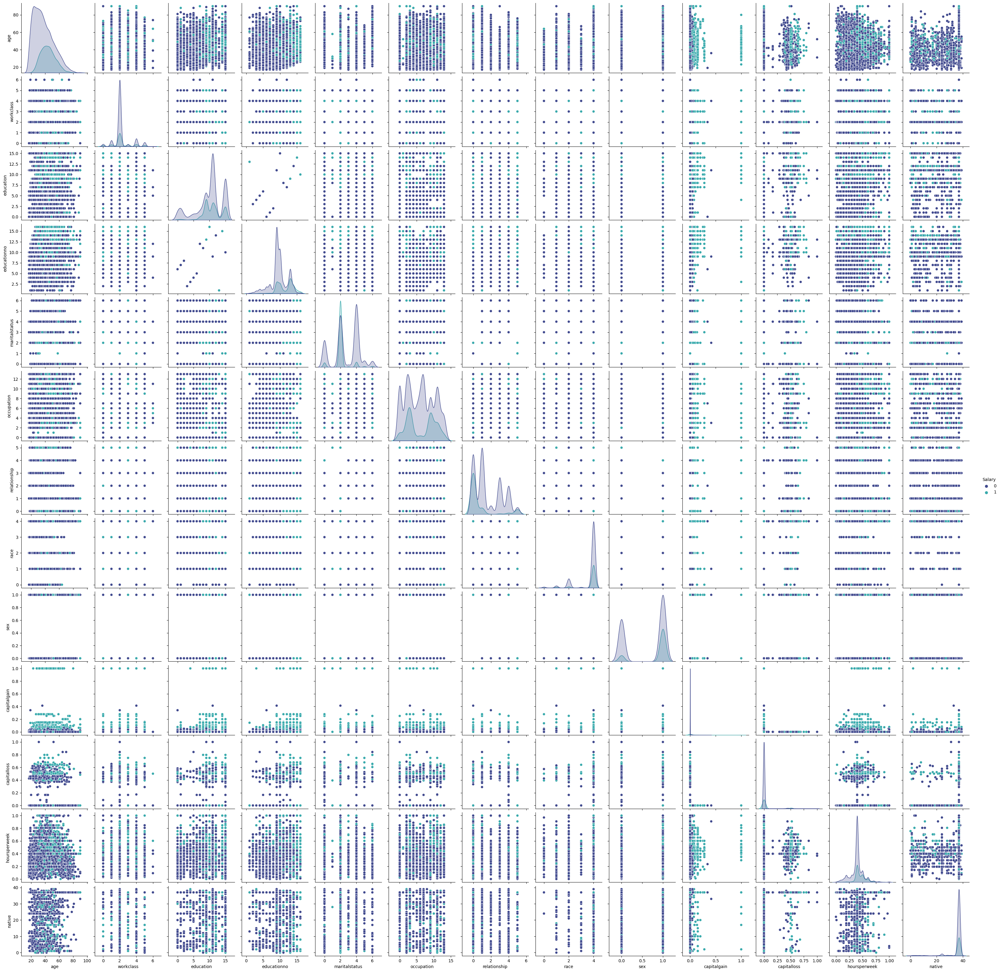

In [59]:
sns.pairplot(testd,palette='mako', hue='Salary')
plt.show()

In [60]:
testd.corr()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
age,1.000000,0.092686,-0.004167,0.021979,-0.245822,-0.003881,-0.241180,0.035180,0.075150,0.076765,0.053172,0.088090,0.001787,0.216703
workclass,0.092686,1.000000,0.021149,0.047708,-0.030821,0.020147,-0.063257,0.064707,0.062290,0.031858,0.007808,0.051189,-0.000432,0.011495
education,-0.004167,0.021149,1.000000,0.361666,-0.044471,-0.017227,-0.013293,0.007635,-0.027574,0.030424,0.024271,0.064155,0.075685,0.092476
educationno,0.021979,0.047708,0.361666,1.000000,-0.070693,0.093437,-0.080444,0.030924,0.000603,0.132346,0.085651,0.127779,0.099699,0.326777
maritalstatus,-0.245822,-0.030821,-0.044471,-0.070693,1.000000,-0.001040,0.172341,-0.076084,-0.114448,-0.042549,-0.033647,-0.165199,-0.017963,-0.185870
occupation,-0.003881,0.020147,-0.017227,0.093437,-0.001040,1.000000,-0.054695,0.004326,0.050982,0.011623,0.012946,0.014548,0.003006,0.046633
relationship,-0.241180,-0.063257,-0.013293,-0.080444,0.172341,-0.054695,1.000000,-0.119236,-0.580247,-0.056609,-0.051241,-0.257082,0.003405,-0.254418
race,0.035180,0.064707,0.007635,0.030924,-0.076084,0.004326,-0.119236,1.000000,0.087171,0.016730,0.020725,0.041720,0.120543,0.073101
sex,0.075150,0.062290,-0.027574,0.000603,-0.114448,0.050982,-0.580247,0.087171,1.000000,0.047180,0.048382,0.227884,-0.017165,0.212100
capitalgain,0.076765,0.031858,0.030424,0.132346,-0.042549,0.011623,-0.056609,0.016730,0.047180,1.000000,-0.033929,0.089512,0.008189,0.225871


[]

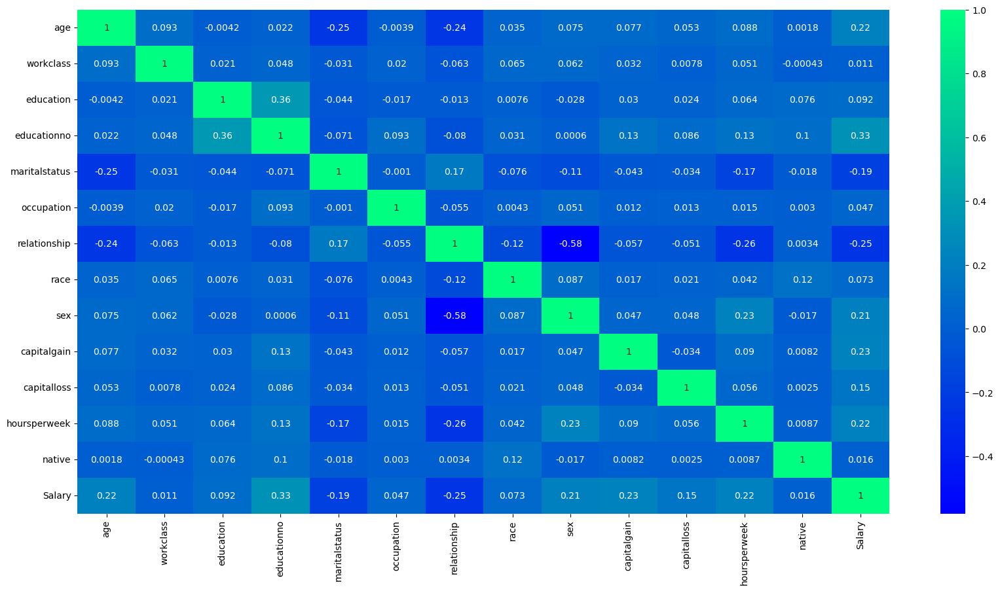

In [61]:
plt.figure(figsize=(20,10))
sns.heatmap(testd.corr(), cmap='winter', annot=True)
plt.plot()

In [62]:
testd.describe()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
count,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000,14130.000000
mean,39.155414,2.226893,10.223355,10.120736,2.589597,6.054140,1.419321,3.664402,0.669144,0.011859,0.025066,0.408917,35.367657,0.248408
std,13.429544,0.991812,3.866601,2.602557,1.524079,4.021648,1.597793,0.849100,0.470538,0.079033,0.110864,0.125184,6.057064,0.432105
min,17.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,29.000000,2.000000,9.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.397959,37.000000,0.000000
50%,38.000000,2.000000,11.000000,10.000000,2.000000,6.000000,1.000000,4.000000,1.000000,0.000000,0.000000,0.397959,37.000000,0.000000
75%,48.000000,2.000000,12.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,0.448980,37.000000,0.000000
max,90.000000,6.000000,15.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,1.000000,1.000000,1.000000,39.000000,1.000000


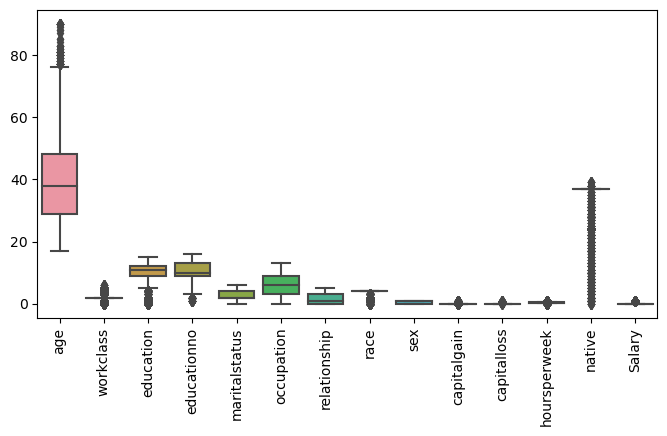

In [63]:
plt.figure(figsize=(8,4))
box = sns.boxplot(data = testd)
plt.xticks(rotation=90)
plt.show()

In [64]:
te_X=testd.iloc[:,:13]
te_y=testd.iloc[:,13]

In [65]:
te_X,te_y=smote.fit_resample(te_X,te_y)
te_X['Salary']=te_y
test=te_X

In [66]:
test.shape

(21240, 14)

In [67]:
test['Salary'].value_counts()

0    10620
1    10620
Name: Salary, dtype: int64

In [68]:
X_test=test.iloc[:,:13]
y_test=test.iloc[:,13]

In [69]:
#Predict a test data
predictions1=ppl.predict(X_test)
predictions1

array([0, 1, 1, ..., 1, 1, 1])

In [70]:
confusion_matrix(y_test,predictions1)

array([[8903, 1717],
       [3290, 7330]], dtype=int64)

In [71]:
print(classification_report(y_test,predictions1))

              precision    recall  f1-score   support

           0       0.73      0.84      0.78     10620
           1       0.81      0.69      0.75     10620

    accuracy                           0.76     21240
   macro avg       0.77      0.76      0.76     21240
weighted avg       0.77      0.76      0.76     21240



In [72]:
#the output probability
test_proba=ppl.predict_proba(X_test)
test_proba

array([[9.99895498e-01, 1.04501999e-04],
       [4.05734544e-01, 5.94265456e-01],
       [4.75556740e-01, 5.24443260e-01],
       ...,
       [4.63163851e-01, 5.36836149e-01],
       [6.08942931e-02, 9.39105707e-01],
       [3.03825905e-01, 6.96174095e-01]])

In [73]:
test_proba[:,1]

array([1.04501999e-04, 5.94265456e-01, 5.24443260e-01, ...,
       5.36836149e-01, 9.39105707e-01, 6.96174095e-01])

In [74]:
#false positive rate,true positive rate,threshhold
fpr1,tpr1,thresh1=roc_curve(y_test,test_proba[:,1])

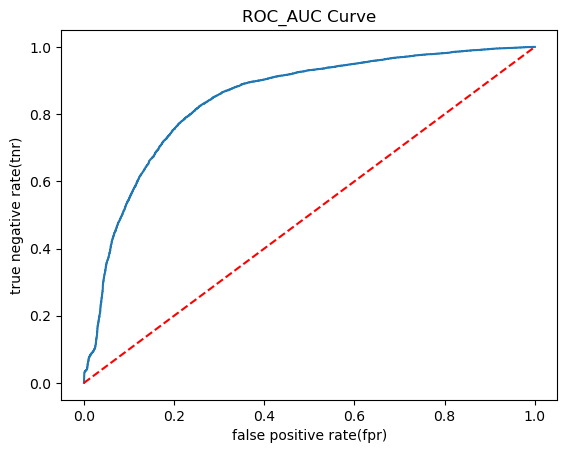

In [75]:
plt.plot(fpr1,tpr1)
plt.plot([0,1],[0,1],'r--')
plt.title('ROC_AUC Curve')
plt.xlabel('false positive rate(fpr)')
plt.ylabel('true negative rate(tnr)')
plt.show()

In [76]:
roc_auc_score(y_test,predictions1)

0.7642655367231639

In [77]:
tsne_comp1=model.fit_transform(X_test)
tsne_comp1

array([[-27.62181  , 106.32193  ],
       [-23.12082  ,  46.96557  ],
       [-48.56614  ,  -2.4906945],
       ...,
       [ 55.649094 ,  26.16561  ],
       [ 74.065575 , -17.780218 ],
       [ 72.566795 ,  85.36173  ]], dtype=float32)

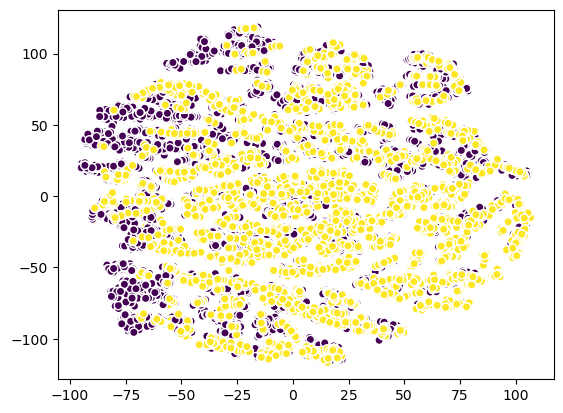

In [102]:
plt.scatter(tsne_comp1[:,0],tsne_comp1[:,1],c=y_test,cmap='viridis',edgecolors='white')
plt.show()

# ****************************************************************************************************************************